In [5]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from os.path import isfile, join
from pathlib import Path
import shutil
import matplotlib.pyplot as plt
import numpy as np


In [6]:

data_path = "C:/Users/nidul/Desktop/ACCA Folder My/Signal processing cup/ROBOVOX_SP_CUP_2024/single-channel/enrollment"

In [7]:
# for clip in os.listdir(data_path):
#     folder_name = str(clip).split("-")[0]
#     if not os.path.isdir(os.path.join(data_path, folder_name)):
#         os.mkdir(os.path.join(data_path, folder_name))
#     shutil.move(
#         os.path.join(data_path, clip), os.path.join(data_path, folder_name, clip)
#     )


In [8]:
from IPython.display import display, Audio

# Function to play audio file
def play_audio(audio_path):
    display(Audio(filename=audio_path))

# Play a specific combined audio file
speaker_folder = "spk_2/spk_2-2_1_1_0_d5_ch5.wav"
audio_path = os.path.join(data_path,speaker_folder )
print(f"Click the play button to listen: {audio_path}")
play_audio(audio_path)


Click the play button to listen: C:/Users/nidul/Desktop/ACCA Folder My/Signal processing cup/ROBOVOX_SP_CUP_2024/single-channel/enrollment\spk_2/spk_2-2_1_1_0_d5_ch5.wav


C:\Users\nidul\AppData\Local\Temp\ipykernel_22408\1656348457.py:21: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


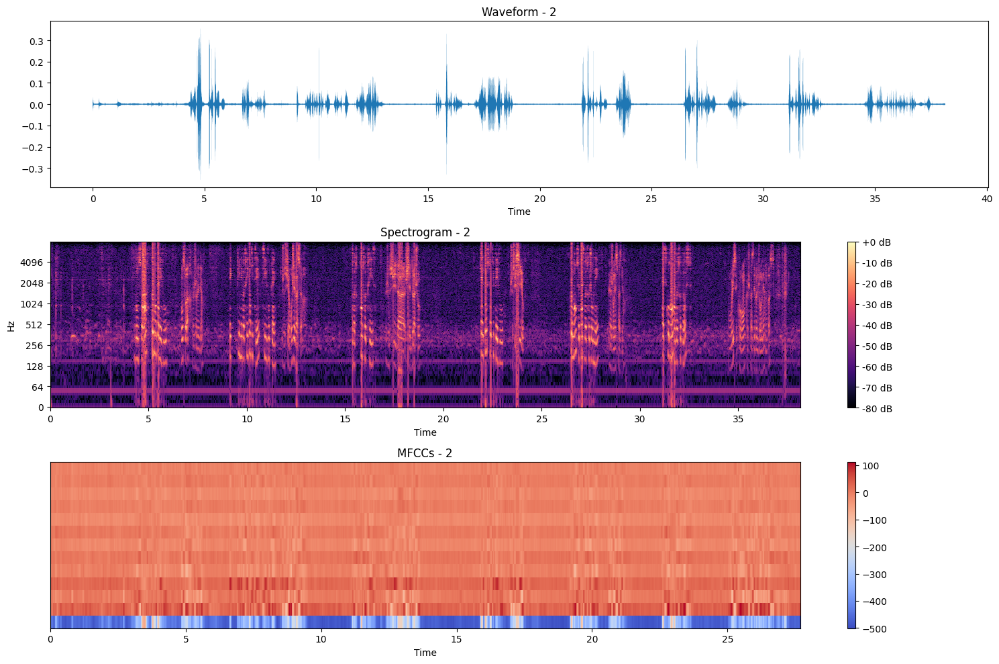

C:\Users\nidul\AppData\Local\Temp\ipykernel_22408\1656348457.py:21: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


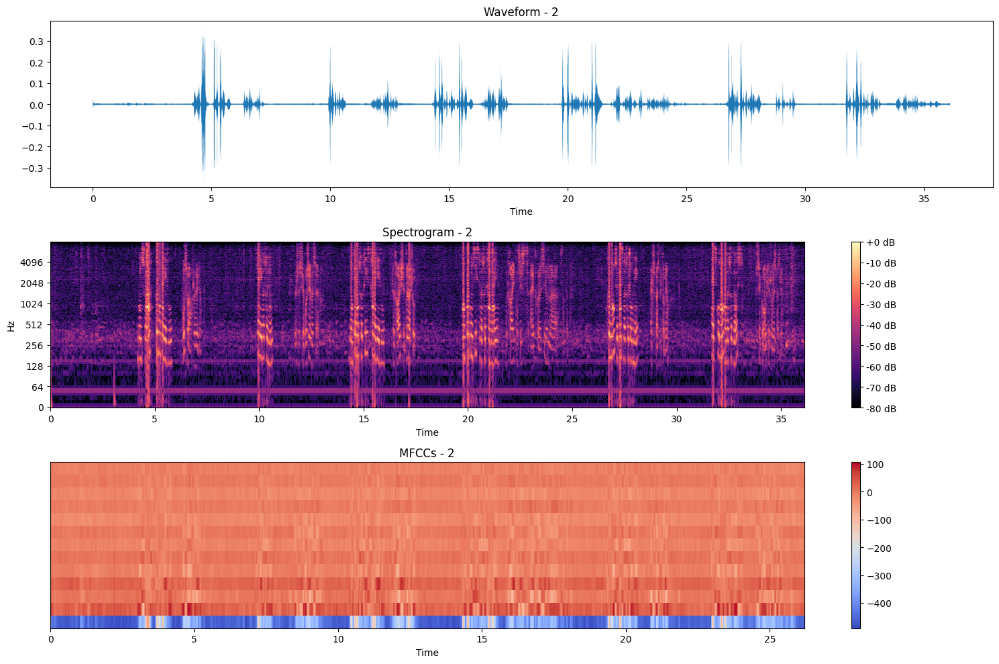

In [9]:
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Function to plot the waveform, spectrogram, and MFCCs
def plot_audio_features(audio_path):
    # Load audio file
    y, sr = librosa.load(audio_path, sr=None)
    
    # Extract speaker name from the file path
    speaker_name = "2"

    # Plot the waveform
    plt.figure(figsize=(15, 10))
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y=y, sr=sr)
    plt.title(f'Waveform - {speaker_name}')

    # Plot the spectrogram
    plt.subplot(3, 1, 2)
    D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {speaker_name}')

    # Plot the MFCCs
    plt.subplot(3, 1, 3)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title(f'MFCCs - {speaker_name}')

    plt.tight_layout()
    plt.show()

# Paths to the combined audio files
audio_paths = [
    'C:/Users/nidul/Desktop/ACCA Folder My/Signal processing cup/ROBOVOX_SP_CUP_2024/samples/1_1_0_1/sound.wav',
    'C:/Users/nidul/Desktop/ACCA Folder My/Signal processing cup/ROBOVOX_SP_CUP_2024/samples/1_1_1_0/sound.wav'
]

# Plot features for each audio file
for audio_path in audio_paths:
    plot_audio_features(audio_path)

In [10]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Set the parent directory for speaker folders
parent_dir = "single-channel/enrollment"

# List of speaker folders
speaker_folders = os.listdir(data_path)

def extract_features(parent_dir, speaker_folders):
    features = []
    labels = []

    for i, speaker_folder in enumerate(speaker_folders):
        speaker_folder_path = os.path.join(parent_dir, speaker_folder)

        for filename in os.listdir(speaker_folder_path):
            if filename.endswith(".wav"):
                file_path = os.path.join(speaker_folder_path, filename)
                audio, sr = librosa.load(file_path, sr=None, duration=1)
                mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=40)
                
                # Normalize MFCC features
                mfccs = StandardScaler().fit_transform(mfccs)
                
                features.append(mfccs.T)
                labels.append(i)

    return np.array(features), np.array(labels)

# Extract features and labels
X, y = extract_features(parent_dir, speaker_folders)
print(y)

[ 0  0  0  1  1  1  2  2  2  3  3  3  4  4  4  5  5  5  6  6  6  7  7  7
  8  8  8  9  9  9 10 10 10 11 11 11 12 12 12 13 13 13 14 14 14 15 15 15
 16 16 16 17 17 17 18 18 18 19 19 19 20 20 20 21 21 21 22 22 22 23 23 23
 24 24 24 25 25 25 26 26 26 27 27 27 28 28 28 29 29 29 30 30 30 31 31 31
 32 32 32 33 33 33 34 34 34 35 35 35 36 36 36 37 37 37 38 38 38 39 39 39
 40 40 40 41 41 41 42 42 42 43 43 43 44 44 44 45 45 45 46 46 46 47 47 47
 48 48 48 49 49 49 50 50 50 51 51 51 52 52 52 53 53 53 54 54 54 55 55 55
 56 56 56 57 57 57 58 58 58 59 59 59 60 60 60 61 61 61 62 62 62 63 63 63
 64 64 64 65 65 65 66 66 66 67 67 67 68 68 68 69 69 69 70 70 70 71 71 71
 72 72 72 73 73 73 74 74 74]


In [11]:
for feature in X[:1]:
    print(feature)

for labels in y[:1]:
    print(labels)

[[-6.142866    0.840334   -0.35349414 ...  0.10136843  0.2299611
   0.22254674]
 [-6.1277614   0.87345296 -0.39346814 ...  0.14737734  0.18939933
   0.21490833]
 [-6.13649     0.86367005 -0.30019736 ...  0.16548556  0.15779978
   0.218373  ]
 ...
 [-2.2478955  -0.2815012  -1.1106067  ... -0.1728793  -0.09360265
   0.29334778]
 [-4.287009   -0.37859073 -1.0452951  ...  0.1706494   0.1101597
   0.6027932 ]
 [-5.4339075  -0.8519361  -0.830396   ...  0.3134021   0.20642754
   0.4379316 ]]
0


In [12]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [13]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Activation,Flatten
from tensorflow.keras.optimizers import Adam
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder

# Encode labels with explicit classes
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
label_encoder.classes_ = np.array(speaker_folders)

print(X.shape)
print(y.shape)
# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Print the shapes of training and validation data
print("Training Data Shape:", X_train.shape)
print("Validation Data Shape:", X_val.shape)
print(X_test.shape)
print(y_test.shape)

(225, 32, 40)
(225,)
Training Data Shape: (157, 32, 40)
Validation Data Shape: (34, 32, 40)
(34, 32, 40)
(34,)


In [14]:
# Define the RNN model
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(128, input_shape=(X.shape[1], X.shape[2])),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(len(speaker_folders), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])



Epoch 1/100
8/8 [==============================] - 0s 18ms/step - loss: 1.2254 - accuracy: 0.7689 - val_loss: 1.0863 - val_accuracy: 0.7941
Epoch 2/100
8/8 [==============================] - 0s 14ms/step - loss: 1.1792 - accuracy: 0.7778 - val_loss: 1.0122 - val_accuracy: 0.7647
Epoch 3/100
8/8 [==============================] - 0s 12ms/step - loss: 1.2646 - accuracy: 0.7333 - val_loss: 1.0421 - val_accuracy: 0.7647
Epoch 4/100
8/8 [==============================] - 0s 12ms/step - loss: 1.1594 - accuracy: 0.7644 - val_loss: 0.9968 - val_accuracy: 0.7647
Epoch 5/100
8/8 [==============================] - 0s 9ms/step - loss: 1.0963 - accuracy: 0.7733 - val_loss: 0.8660 - val_accuracy: 0.8824
Epoch 6/100
8/8 [==============================] - 0s 10ms/step - loss: 1.0504 - accuracy: 0.8222 - val_loss: 0.7492 - val_accuracy: 0.8529
Epoch 7/100
8/8 [==============================] - 0s 10ms/step - loss: 1.0080 - accuracy: 0.8133 - val_loss: 0.7154 - val_accuracy: 0.8824
Epoch 8/100
8/8 [====

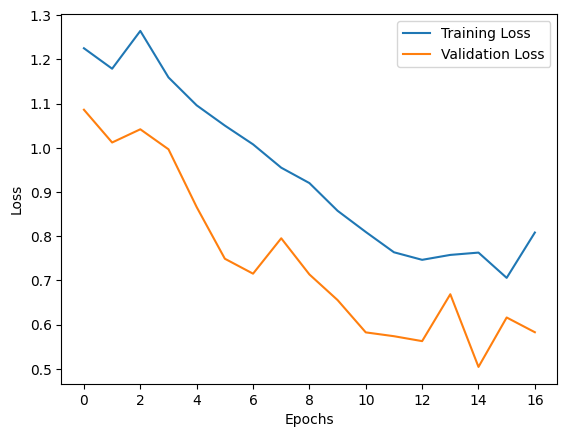

In [22]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Train the model with EarlyStopping
history = model.fit(X, y, validation_data=(X_val, y_val), epochs=100, batch_size=32, callbacks=[early_stopping])

# Check if EarlyStopping triggered
if early_stopping.stopped_epoch > 0:
    print("Early stopping triggered at epoch", early_stopping.stopped_epoch + 1)
else:
    print("Training completed without early stopping")

# Plot training vs validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

2/2 [==============================] - 0s 5ms/step
(34, 32, 40)
(34, 75)
Test Evaluation Accuracy: 0.8529411764705882
Weighted F1 Score: 0.872549019607843


c:\Users\nidul\.conda\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1760: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))


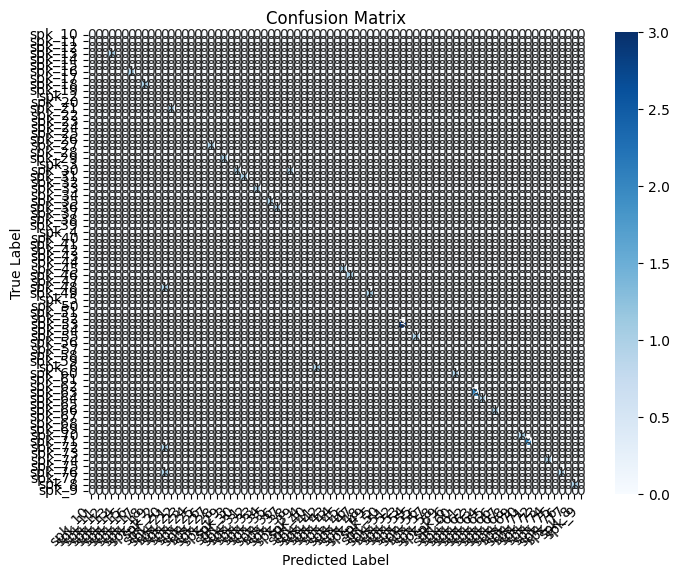

In [23]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score

# Evaluate the model on the test set
y_pred_probabilities = model.predict(X_test)
print(X_test.shape)
print(y_pred_probabilities.shape)
y_pred = np.argmax(y_pred_probabilities, axis=1)

# Decode labels back to original format
y_test_decoded = label_encoder.inverse_transform(y_test)
y_pred_decoded = label_encoder.inverse_transform(y_pred)

# Create a confusion matrix
conf_matrix = confusion_matrix(y_test_decoded, y_pred_decoded, labels=speaker_folders)

# Calculate accuracy
accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Test Evaluation Accuracy: {accuracy}")

# Calculate F1 score
f1 = f1_score(y_test_decoded, y_pred_decoded, labels=speaker_folders, average='weighted')
print(f"Weighted F1 Score: {f1}")

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=speaker_folders, yticklabels=speaker_folders)

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=45, ha="right")

plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [24]:
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()
# y=to_categorical(labelencoder.fit_transform(y))

In [25]:
# filename="C:/Users/nidul/Desktop/ACCA Folder My/Signal processing cup/ROBOVOX_SP_CUP_2024/single-channel/test/fff3d89c75.wav"
filename = "C:/Users/nidul/Desktop/ACCA Folder My/Signal processing cup/ROBOVOX_SP_CUP_2024/single-channel/enrollment/spk_29/spk_29-29_52_0_0_d6_ch5.wav"
audio, sr = librosa.load(filename, sr=None, duration=1)
mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=40)
                
                # Normalize MFCC features
mfccs = StandardScaler().fit_transform(mfccs)
predicted_label=model.predict(np.array([mfccs.T]))
print(mfccs.T.reshape(1,1,-1))
print(predicted_label.shape)
print(predicted_label[0][1])
y_pred = np.argmax(predicted_label, axis=1)
# print(y_pred)
# prediction_class = labelencoder.inverse_transform(predicted_label) 
# prediction_class
# print(y)
print(speaker_folders)
print(speaker_folders[y_pred[0]])

1/1 [==============================] - 0s 28ms/step
[[[-6.201765   -0.18946932 -0.09569568 ...  0.09204689  0.2653683
    0.31437564]]]
(1, 75)
0.00017806665
['spk_10', 'spk_11', 'spk_12', 'spk_13', 'spk_14', 'spk_15', 'spk_16', 'spk_17', 'spk_18', 'spk_19', 'spk_2', 'spk_20', 'spk_21', 'spk_22', 'spk_23', 'spk_24', 'spk_25', 'spk_26', 'spk_27', 'spk_28', 'spk_29', 'spk_3', 'spk_30', 'spk_31', 'spk_32', 'spk_33', 'spk_34', 'spk_35', 'spk_36', 'spk_37', 'spk_38', 'spk_39', 'spk_4', 'spk_40', 'spk_41', 'spk_42', 'spk_43', 'spk_44', 'spk_45', 'spk_46', 'spk_47', 'spk_48', 'spk_49', 'spk_5', 'spk_50', 'spk_51', 'spk_52', 'spk_53', 'spk_54', 'spk_55', 'spk_56', 'spk_57', 'spk_58', 'spk_59', 'spk_6', 'spk_60', 'spk_61', 'spk_62', 'spk_63', 'spk_64', 'spk_65', 'spk_66', 'spk_67', 'spk_68', 'spk_69', 'spk_70', 'spk_71', 'spk_72', 'spk_73', 'spk_74', 'spk_75', 'spk_76', 'spk_77', 'spk_8', 'spk_9']
spk_29


In [ ]:
avgs = []
for clip in os.listdir(data_path):
    addition=[0]*75
    for aud_f in os.listdir(os.path.join(data_path,clip)):
        filename = os.path.join(data_path,clip,aud_f)
        audio, sr = librosa.load(filename, sr=None, duration=1)
        mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=40)
                        
                        # Normalize MFCC features
        mfccs = StandardScaler().fit_transform(mfccs)
        predicted_label=model.predict(np.array([mfccs.T]))
        addition += np.array(predicted_label[0])
        # print(addition)
    avgs.append([clip,addition/3])

        


In [43]:
avgs = dict(avgs)
print(avgs['spk_11'])


[3.20706130e-05 7.35522479e-01 6.00331074e-04 3.79570144e-06
 2.68241543e-03 6.52548907e-05 1.18232863e-05 2.27858550e-05
 1.69837659e-04 1.65642802e-04 9.55638080e-03 1.49646691e-03
 8.77972595e-03 6.86523480e-04 1.33206750e-05 8.36122971e-05
 5.81396021e-03 3.82883206e-05 1.12619164e-04 1.00321374e-02
 8.82402122e-04 1.20161490e-03 4.08955201e-03 4.08791681e-02
 6.62154238e-05 3.40584397e-05 4.30299831e-04 4.93625688e-03
 8.80940572e-04 1.40770763e-02 3.22239731e-04 1.25413950e-02
 1.26596789e-04 3.16799791e-02 9.40915791e-03 5.76464865e-03
 1.16727607e-02 4.15721697e-03 2.20028243e-05 6.26609275e-03
 5.07094472e-05 1.20998156e-04 1.63339999e-04 6.94729019e-03
 2.30397645e-03 1.63746337e-03 6.11809434e-03 1.77646508e-05
 8.72691816e-03 7.74381834e-04 1.32567490e-03 1.93434492e-05
 2.29168368e-03 7.18208870e-04 2.22241623e-03 1.09136871e-03
 1.55995947e-04 6.00807459e-03 1.47910663e-03 1.09800094e-03
 4.43416529e-03 4.88226106e-05 2.02241276e-03 5.89735834e-05
 3.82978055e-05 3.230225

In [59]:


# a file named "geek", will be opened with the reading mode.
file = open('single-channel/signle-channel-trials.trl', 'r')
 
# This will print every line one by one in the file
for each in file:
    print (str(each).strip().split("\t"))

['spk_71', 'b80bb95d16']
['spk_71', 'e64da37b33']
['spk_71', 'c22d8f9d8a']
['spk_71', '20e087d5bf']
['spk_71', 'c5396d4af7']
['spk_71', '07e622c018']
['spk_71', '70d3397783']
['spk_71', 'e967199344']
['spk_71', '35e670b698']
['spk_71', '6d80d0d2a1']
['spk_71', '97bbaeadba']
['spk_71', 'a62faf1119']
['spk_71', '34ceda1014']
['spk_71', '33e5a6f028']
['spk_71', 'bf3c182f9a']
['spk_71', 'e350f7e8d3']
['spk_71', '16a0dfa929']
['spk_71', '0c5875ee78']
['spk_71', 'b965a8584d']
['spk_71', '3bb3d70992']
['spk_71', '28283fdfe9']
['spk_71', 'c32b02c633']
['spk_71', '9f6008448e']
['spk_71', 'c399f9f4b9']
['spk_71', '4a13ea812b']
['spk_71', '6921397f4e']
['spk_71', '615afd399e']
['spk_71', '6a9bf1b286']
['spk_71', '0f6fcf528a']
['spk_71', '96cec5103b']
['spk_71', '782e9b8523']
['spk_71', 'a1dda7f0e2']
['spk_71', 'a08d312960']
['spk_71', '56bee043e3']
['spk_71', '9fd12381f2']
['spk_71', '619292f499']
['spk_71', '60a0903b33']
['spk_71', '8dcdd239d0']
['spk_71', '6cb846821e']
['spk_71', 'fddde75bdc']


In [55]:


# Python code to illustrate with()
with open("single-channel/signle-channel-trials.trl") as file:  
    data = file.read() 
 
print(list(data))

['s', 'p', 'k', '_', '7', '1', '\t', 'b', '8', '0', 'b', 'b', '9', '5', 'd', '1', '6', '\n', 's', 'p', 'k', '_', '7', '1', '\t', 'e', '6', '4', 'd', 'a', '3', '7', 'b', '3', '3', '\n', 's', 'p', 'k', '_', '7', '1', '\t', 'c', '2', '2', 'd', '8', 'f', '9', 'd', '8', 'a', '\n', 's', 'p', 'k', '_', '7', '1', '\t', '2', '0', 'e', '0', '8', '7', 'd', '5', 'b', 'f', '\n', 's', 'p', 'k', '_', '7', '1', '\t', 'c', '5', '3', '9', '6', 'd', '4', 'a', 'f', '7', '\n', 's', 'p', 'k', '_', '7', '1', '\t', '0', '7', 'e', '6', '2', '2', 'c', '0', '1', '8', '\n', 's', 'p', 'k', '_', '7', '1', '\t', '7', '0', 'd', '3', '3', '9', '7', '7', '8', '3', '\n', 's', 'p', 'k', '_', '7', '1', '\t', 'e', '9', '6', '7', '1', '9', '9', '3', '4', '4', '\n', 's', 'p', 'k', '_', '7', '1', '\t', '3', '5', 'e', '6', '7', '0', 'b', '6', '9', '8', '\n', 's', 'p', 'k', '_', '7', '1', '\t', '6', 'd', '8', '0', 'd', '0', 'd', '2', 'a', '1', '\n', 's', 'p', 'k', '_', '7', '1', '\t', '9', '7', 'b', 'b', 'a', 'e', 'a', 'd', 'b'

<center>////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////</center>
<center>Optional part</center>

In [ ]:
from scipy.io import wavfile as wav
wave_sample_rate, wave_audio = wav.read("C:/Users/nidul/Desktop/ACCA Folder My/Signal processing cup/ROBOVOX_SP_CUP_2024/samples/1_37_1_0/sound.wav") 

In [ ]:
print(wave_audio)

[[   0    0    0 ...    0    0    0]
 [   1    1    1 ...    1    0    0]
 [   0    0    0 ...    0    0    0]
 ...
 [  -1  105   77 ...   -3    2   -7]
 [  49  -25   34 ...   -3   -1   -8]
 [  35 -162   -7 ...   -7   -3   -8]]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


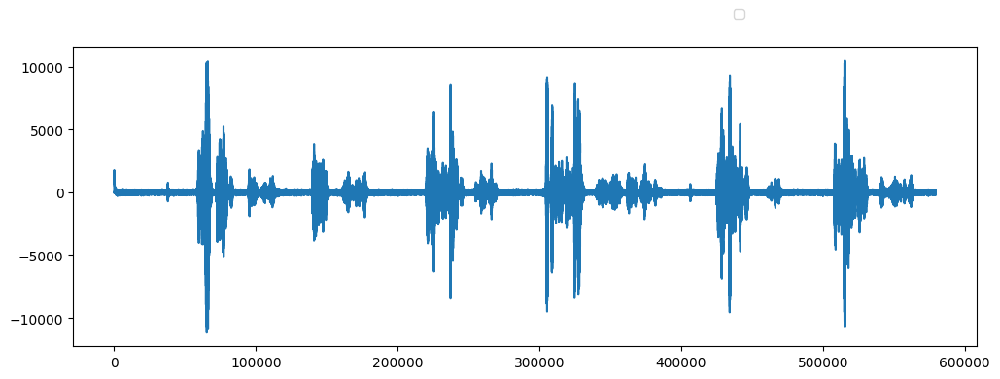

In [ ]:
import matplotlib.pyplot as plt

# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.legend()
plt.plot(wave_audio[:,1])
plt.legend(bbox_to_anchor=(0.75, 1.15), ncol=8)